# StyleGAN-NADA: Адаптация StyleGAN2-FFHQ к аниме стилю


In [1]:
%pip install torch torchvision numpy Pillow tqdm matplotlib scipy lpips einops
%pip install git+https://github.com/openai/CLIP.git
%pip install ninja

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
import numpy as np
from einops import rearrange
import clip
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os
import requests
from io import BytesIO
import zipfile
import copy
import pickle
import subprocess
import sys
import glob
import tarfile
import shutil
import urllib.request

# Импорты для работы с данными
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder

import warnings
warnings.filterwarnings('ignore')

print("Все импорты загружены успешно")

# Проверка GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Устройство: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name()}")
    print(f"Память GPU: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00:00:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00:00:01m0:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 26.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 65.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 2.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existing inst

## 2. Загрузка StyleGAN2 и CLIP

In [2]:
print("CLIP-Guided Domain Adaptation of Image Generators")
print("=" * 60)
print("Основная задача:")
print("1. Загрузить предобученный StyleGAN2-FFHQ")
print("2. Создать G_frozen (замороженный) и G_train (обучаемый)")
print("3. Использовать CLIP для направления адаптации")
print("4. Адаптировать лица людей в аниме стиль")
print("=" * 60)

def install_stylegan2_dependencies():
    """Устанавливает зависимости для работы с официальным StyleGAN2"""
    try:
        import subprocess
        import sys
        
        # Установка ninja для компиляции CUDA extensions
        subprocess.check_call([sys.executable, "-m", "pip", "install", "ninja"])
        
        # Клонируем официальный репозиторий StyleGAN2-ADA-PyTorch
        if not os.path.exists("stylegan2-ada-pytorch"):
            subprocess.run(["git", "clone", "https://github.com/NVlabs/stylegan2-ada-pytorch.git"], 
                          check=True)
            print("StyleGAN2-ADA-PyTorch репозиторий клонирован")
        
        # Добавляем в sys.path
        if "stylegan2-ada-pytorch" not in sys.path:
            sys.path.insert(0, "stylegan2-ada-pytorch")
        
        return True
        
    except Exception as e:
        print(f"Ошибка установки: {e}")
        print("Будет использована упрощенная реализация")
        return False

def download_stylegan2_ffhq():
    """Загружает официальную предобученную модель StyleGAN2-FFHQ"""
    
    model_url = "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl"
    model_path = "pretrained/stylegan2-ffhq-1024x1024.pkl"
    
    os.makedirs("pretrained", exist_ok=True)
    
    if os.path.exists(model_path):
        print(f"Модель уже загружена: {model_path}")
        return model_path
    
    print(f"Загрузка StyleGAN2-FFHQ (размер: ~600MB)...")
    print(f"URL: {model_url}")
    
    try:
        response = requests.get(model_url, stream=True)
        response.raise_for_status()
        
        total_size = int(response.headers.get('content-length', 0))
        
        with open(model_path, 'wb') as f:
            if total_size > 0:
                with tqdm(total=total_size, unit='B', unit_scale=True, desc="Загрузка StyleGAN2") as pbar:
                    for chunk in response.iter_content(chunk_size=8192):
                        if chunk:
                            f.write(chunk)
                            pbar.update(len(chunk))
        
        print(f"StyleGAN2-FFHQ успешно загружен: {model_path}")
        print(f"Размер: {os.path.getsize(model_path) / (1024*1024):.1f} MB")
        return model_path
        
    except Exception as e:
        print(f"Ошибка загрузки: {e}")
        if os.path.exists(model_path):
            os.remove(model_path)
        return None

def load_stylegan2_generator(model_path, device='cuda'):
    """Загружает StyleGAN2 генератор из .pkl файла"""
    
    if not os.path.exists(model_path):
        print(f"Файл не найден: {model_path}")
        return None
    
    print(f"Загрузка StyleGAN2 генератора...")
    
    try:
        # Загружаем модель
        with open(model_path, 'rb') as f:
            data = pickle.load(f)
        
        # Извлекаем генератор
        if 'G_ema' in data:
            generator = data['G_ema'].to(device)
            print("Загружен G_ema (exponentially averaged generator)")
        elif 'G' in data:
            generator = data['G'].to(device)
            print("Загружен основной генератор G")
        else:
            print("Генератор не найден в файле")
            return None
        
        generator.eval()
        
        # Информация о модели
        print(f"Информация о StyleGAN2:")
        print(f"Разрешение: {generator.img_resolution}x{generator.img_resolution}")
        print(f"Каналы: {generator.img_channels}")
        print(f"z_dim: {generator.z_dim}")
        print(f"w_dim: {generator.w_dim}")
        
        # Подсчет параметров
        total_params = sum(p.numel() for p in generator.parameters())
        print(f"Параметров: {total_params:,}")
        
        return generator
        
    except Exception as e:
        print(f"Ошибка загрузки генератора: {e}")
        return None

# УСТАНОВКА И ЗАГРУЗКА
print("Установка зависимостей StyleGAN2...")
success = install_stylegan2_dependencies()

if success:
    print("Готов к работе с официальным StyleGAN2")
else:
    print("Используем упрощенную реализацию для демонстрации концепции")

# ЗАГРУЗКА STYLEGAN2-FFHQ
print("\nЗагрузка предобученной модели StyleGAN2-FFHQ...")
model_path = download_stylegan2_ffhq()

if model_path:
    G = load_stylegan2_generator(model_path, device)
    if G is None:
        # Fallback к простой загрузке
        print("Использую упрощенную загрузку...")
        with open(model_path, 'rb') as f:
            G = pickle.load(f)['G_ema'].to(device).eval()
        print(f"StyleGAN2 загружен. Размер изображения: {G.img_resolution}x{G.img_resolution}")
else:
    print("Ошибка загрузки StyleGAN2. Проверьте интернет-соединение.")

# ЗАГРУЗКА CLIP
print("\nЗагрузка CLIP модели...")
clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)
print("CLIP модель загружена")

print("\nВсе модели готовы к работе!")

CLIP-Guided Domain Adaptation of Image Generators
Основная задача:
1. Загрузить предобученный StyleGAN2-FFHQ
2. Создать G_frozen (замороженный) и G_train (обучаемый)
3. Использовать CLIP для направления адаптации
4. Адаптировать лица людей в аниме стиль
Установка зависимостей StyleGAN2...


Cloning into 'stylegan2-ada-pytorch'...


StyleGAN2-ADA-PyTorch репозиторий клонирован
Готов к работе с официальным StyleGAN2

Загрузка предобученной модели StyleGAN2-FFHQ...
Загрузка StyleGAN2-FFHQ (размер: ~600MB)...
URL: https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl


Загрузка StyleGAN2:   0%|          | 0.00/382M [00:00<?, ?B/s]

StyleGAN2-FFHQ успешно загружен: pretrained/stylegan2-ffhq-1024x1024.pkl
Размер: 363.9 MB
Загрузка StyleGAN2 генератора...
Загружен G_ema (exponentially averaged generator)
Информация о StyleGAN2:
Разрешение: 1024x1024
Каналы: 3
z_dim: 512
w_dim: 512
Параметров: 30,370,060

Загрузка CLIP модели...


100%|███████████████████████████████████████| 338M/338M [00:06<00:00, 55.5MiB/s]


CLIP модель загружена

Все модели готовы к работе!


## 2.1. Дополнительные функции загрузки и работы с данными

In [3]:
def download_official_stylegan2_model(model_name='ffhq'):
    """Загружает различные официальные модели StyleGAN2"""
    
    # Официальные предобученные модели
    official_models = {
        'ffhq': 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl',
        'ffhq_256': 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl',
        'afhqcat': 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqcat.pkl',
        'afhqdog': 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqdog.pkl',
        'afhqwild': 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqwild.pkl',
        'metfaces': 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metfaces.pkl'
    }
    
    if model_name not in official_models:
        print(f"Модель '{model_name}' не найдена. Доступные: {list(official_models.keys())}")
        return None
    
    url = official_models[model_name]
    model_path = f"pretrained/stylegan2-{model_name}.pkl"
    
    os.makedirs("pretrained", exist_ok=True)
    
    if os.path.exists(model_path):
        print(f"Модель {model_name} уже загружена: {model_path}")
        return model_path
    
    print(f"Загрузка StyleGAN2-{model_name.upper()}...")
    print(f"URL: {url}")
    
    try:
        response = requests.get(url, stream=True)
        response.raise_for_status()
        
        total_size = int(response.headers.get('content-length', 0))
        
        with open(model_path, 'wb') as f:
            if total_size > 0:
                with tqdm(total=total_size, unit='B', unit_scale=True, desc=f"Загрузка {model_name}") as pbar:
                    for chunk in response.iter_content(chunk_size=8192):
                        if chunk:
                            f.write(chunk)
                            pbar.update(len(chunk))
        
        print(f"StyleGAN2-{model_name} успешно загружен: {model_path}")
        print(f"Размер: {os.path.getsize(model_path) / (1024*1024):.1f} MB")
        return model_path
        
    except Exception as e:
        print(f"Ошибка загрузки {model_name}: {e}")
        if os.path.exists(model_path):
            os.remove(model_path)
        return None

def load_official_stylegan2_generator(model_path, device='cuda'):
    """Загружает официальный StyleGAN2 генератор с детальной информацией"""
    
    if not os.path.exists(model_path):
        print(f"Файл не найден: {model_path}")
        return None
    
    print(f"Загрузка StyleGAN2 генератора из {model_path}...")
    
    try:
        # Загружаем модель
        with open(model_path, 'rb') as f:
            data = pickle.load(f)
        
        # Извлекаем генератор
        if 'G_ema' in data:
            generator = data['G_ema'].to(device)
            print("Загружен G_ema (exponentially averaged generator)")
        elif 'G' in data:
            generator = data['G'].to(device)
            print("Загружен основной генератор G")
        else:
            print("Генератор не найден в файле")
            return None
        
        generator.eval()
        
        # Детальная информация о модели
        print(f"\\nИнформация о StyleGAN2:")
        print(f"  Разрешение: {generator.img_resolution}x{generator.img_resolution}")
        print(f"  Каналы: {generator.img_channels}")
        print(f"  Z dim: {generator.z_dim}")
        print(f"  W dim: {generator.w_dim}")
        print(f"  Количество слоев: {generator.num_ws}")
        
        # Подсчет параметров
        total_params = sum(p.numel() for p in generator.parameters())
        trainable_params = sum(p.numel() for p in generator.parameters() if p.requires_grad)
        print(f"  Общие параметры: {total_params:,}")
        print(f"  Обучаемые параметры: {trainable_params:,}")
        
        return generator
        
    except Exception as e:
        print(f"Ошибка загрузки генератора: {e}")
        return None

# ПОДДЕРЖКА ДАТАСЕТОВ

class CustomImageDataset(Dataset):
    """Кастомный датасет для загрузки изображений"""
    
    def __init__(self, root_dir, target_size=256, transform=None):
        self.root_dir = root_dir
        self.target_size = target_size
        
        # Поддерживаемые форматы
        self.valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp'}
        
        # Найти все изображения
        self.image_paths = []
        if os.path.exists(root_dir):
            for ext in self.valid_extensions:
                pattern = os.path.join(root_dir, f"**/*{ext}")
                self.image_paths.extend(glob.glob(pattern, recursive=True))
                pattern = os.path.join(root_dir, f"**/*{ext.upper()}")
                self.image_paths.extend(glob.glob(pattern, recursive=True))
        
        self.image_paths = list(set(self.image_paths))  # Убираем дубликаты
        
        # Трансформации
        if transform is None:
            self.transform = transforms.Compose([
                transforms.Resize((target_size, target_size)),
                transforms.ToTensor(),
                transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # [-1, 1]
            ])
        else:
            self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        
        try:
            image = Image.open(img_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
            return image
        except Exception as e:
            print(f"Ошибка загрузки {img_path}: {e}")
            # Возвращаем пустое изображение
            return torch.zeros(3, self.target_size, self.target_size)

def download_anime_dataset():
    """Инструкции по загрузке аниме датасета"""
    dataset_url = "https://www.kaggle.com/datasets/splcher/animefacedataset"
    
    print("Инструкции по загрузке датасета аниме лиц:")
    print("1. Перейдите по ссылке:", dataset_url)
    print("2. Скачайте архив и распакуйте в папку 'datasets/anime_faces'")
    print("3. Структура должна быть: datasets/anime_faces/*.jpg")

def download_sample_images():
    """Загружает образцы изображений для тестирования"""
    os.makedirs('datasets/sample_images', exist_ok=True)
    
        sample_urls = [
        "https://upload.wikimedia.org/wikipedia/commons/thumb/5/50/Vd-Orig.png/256px-Vd-Orig.png",
        "https://upload.wikimedia.org/wikipedia/commons/thumb/c/c3/RGBCube_b.png/256px-RGBCube_b.png"
    ]
    
    for i, url in enumerate(sample_urls):
        try:
            filename = f'datasets/sample_images/sample_{i}.png'
            urllib.request.urlretrieve(url, filename)
            print(f"Загружен образец: {filename}")
        except Exception as e:
            print(f"Ошибка при скачивании {url}: {e}")

def create_dataloader(dataset_path, batch_size=4, target_size=256):
    """Создает DataLoader для обучения"""
    if not os.path.exists(dataset_path):
        print(f"Папка {dataset_path} не существует!")
        print("Создаю образцы изображений...")
        download_sample_images()
        dataset_path = 'datasets/sample_images'
    
    dataset = CustomImageDataset(dataset_path, target_size=target_size)
    
    if len(dataset) == 0:
        print(f"В папке {dataset_path} нет изображений!")
        return None
    
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    return dataloader

def create_trainable_copy_stylegan(generator, device='cuda'):
    """Создает обучаемую копию генератора для адаптации"""
    print("Создание обучаемой копии генератора...")
    
    # Создаем глубокую копию
    trainable_generator = copy.deepcopy(generator)
    trainable_generator = trainable_generator.to(device)
    trainable_generator.train()  # Режим обучения
    
    # Включаем градиенты для всех параметров
    for param in trainable_generator.parameters():
        param.requires_grad = True
    
    print("G_train создан (обучаемая копия)")
    return trainable_generator

def freeze_generator(generator):
    """Замораживает генератор (отключает градиенты)"""
    generator.eval()
    for param in generator.parameters():
        param.requires_grad = False
    print("G_frozen создан (замороженный оригинал)")
    return generator

print("Дополнительные функции загрузки и работы с данными готовы!")


Дополнительные функции загрузки и работы с данными готовы!


## 2.2. Информация о доступных датасетах

In [4]:
print("Тестирование загрузки альтернативных StyleGAN2 моделей...")

# Список доступных моделей для тестирования
available_models = ['ffhq', 'afhqcat', 'afhqdog', 'metfaces']

print("Доступные предобученные модели StyleGAN2:")
for model_name in available_models:
    print(f"  - {model_name}: Для адаптации {model_name.upper()} доменов")

print("\\nПримечание: Для экономии времени и места используем FFHQ")
print("Для других экспериментов можете загрузить альтернативные модели:")

print("\\n# Пример загрузки альтернативной модели:")
print("# model_name = 'afhqcat'  # Для адаптации кошек")
print("# model_path = download_official_stylegan2_model(model_name)")
print("# if model_path:")
print("#     generator_alternative = load_official_stylegan2_generator(model_path, device)")

print("\\nСистема поддержки альтернативных моделей готова!")

# Информация о текущей модели
if 'G' in locals():
    print(f"\\nТекущая загруженная модель:")
    print(f"  Разрешение: {G.img_resolution}x{G.img_resolution}")
    print(f"  Количество параметров: {sum(p.numel() for p in G.parameters()):,}")
    print("  Готова к адаптации!")


Тестирование загрузки альтернативных StyleGAN2 моделей...
Доступные предобученные модели StyleGAN2:
  - ffhq: Для адаптации FFHQ доменов
  - afhqcat: Для адаптации AFHQCAT доменов
  - afhqdog: Для адаптации AFHQDOG доменов
  - metfaces: Для адаптации METFACES доменов
\nПримечание: Для экономии времени и места используем FFHQ
Для других экспериментов можете загрузить альтернативные модели:
\n# Пример загрузки альтернативной модели:
# model_name = 'afhqcat'  # Для адаптации кошек
# model_path = download_official_stylegan2_model(model_name)
# if model_path:
#     generator_alternative = load_official_stylegan2_generator(model_path, device)
\nСистема поддержки альтернативных моделей готова!
\nТекущая загруженная модель:
  Разрешение: 1024x1024
  Количество параметров: 30,370,060
  Готова к адаптации!


In [5]:
print("Подготовка инфраструктуры для работы с датасетами...")

# Инструкции по загрузке аниме датасета
download_anime_dataset()

print("\\nПопытка создать dataloader...")
# Попробуем создать dataloader
dataset_paths = [
    'datasets/anime_faces',  # Основной путь для аниме лиц
    'datasets/target_domain',  # Альтернативный путь
    'datasets/sample_images'  # Fallback путь с образцами
]

dataloader = None
for path in dataset_paths:
    print(f"\\nПроверяем путь: {path}")
    if os.path.exists(path):
        try:
            dataloader = create_dataloader(path, batch_size=4, target_size=256)
            if dataloader and len(dataloader.dataset) > 0:
                print(f"Датасет найден: {len(dataloader.dataset)} изображений")
                print(f"   Batch size: {dataloader.batch_size}")
                print(f"   Используемый путь: {path}")
                break
            else:
                print(f"Папка {path} пуста")
        except Exception as e:
            print(f"Ошибка создания dataloader для {path}: {e}")
    else:
        print(f"Путь {path} не существует")

if dataloader is None:
    print("\\nДатасет не найден. Создаю образцы для демонстрации...")
    download_sample_images()
    try:
        dataloader = create_dataloader('datasets/sample_images', batch_size=4, target_size=256)
        if dataloader:
            print(f"Создан демонстрационный датасет: {len(dataloader.dataset)} образцов")
    except Exception as e:
        print(f"Не удалось создать демонстрационный датасет: {e}")

# Информация о датасете
if dataloader:
    print(f"\\nСтатистика датасета:")
    print(f"  Количество изображений: {len(dataloader.dataset)}")
    print(f"  Размер батча: {dataloader.batch_size}")
    print(f"  Количество батчей: {len(dataloader)}")
    print(f"  Целевое разрешение: 256x256")
    print("  Нормализация: [-1, 1] (совместимо с StyleGAN)")
    
    # Попробуем загрузить один батч для тестирования
    try:
        sample_batch = next(iter(dataloader))
        print(f"  Форма батча: {sample_batch.shape}")
        print(f"  Диапазон значений: [{sample_batch.min():.3f}, {sample_batch.max():.3f}]")
        print("Датасет готов к использованию!")
    except Exception as e:
        print(f"Ошибка тестирования датасета: {e}")
else:
    print("\\nДатасет недоступен. Обучение будет проводиться только с сгенерированными изображениями.")

print("\\nНастройка датасетов завершена!")


Подготовка инфраструктуры для работы с датасетами...
Инструкции по загрузке датасета аниме лиц:
1. Перейдите по ссылке: https://www.kaggle.com/datasets/splcher/animefacedataset
2. Скачайте архив и распакуйте в папку 'datasets/anime_faces'
3. Структура должна быть: datasets/anime_faces/*.jpg
\nПопытка создать dataloader...
\nПроверяем путь: datasets/anime_faces
Путь datasets/anime_faces не существует
\nПроверяем путь: datasets/target_domain
Путь datasets/target_domain не существует
\nПроверяем путь: datasets/sample_images
Путь datasets/sample_images не существует
\nДатасет не найден. Создаю образцы для демонстрации...
Загружен образец: datasets/sample_images/sample_0.png
Ошибка при скачивании https://upload.wikimedia.org/wikipedia/commons/thumb/c/c3/RGBCube_b.png/256px-RGBCube_b.png: HTTP Error 404: Not Found
Создан демонстрационный датасет: 1 образцов
\nСтатистика датасета:
  Количество изображений: 1
  Размер батча: 4
  Количество батчей: 1
  Целевое разрешение: 256x256
  Нормализация

## 3. Utility функции

In [6]:
def tensor_to_pil(tensor):
    """Преобразование тензора [-1, 1] в PIL изображение"""
    with torch.no_grad():
        tensor = (tensor + 1) / 2  # [-1, 1] -> [0, 1]
        tensor = torch.clamp(tensor, 0, 1)
        if len(tensor.shape) == 4:
            tensor = tensor[0]
        array = tensor.detach().cpu().numpy().transpose(1, 2, 0)
        array = (array * 255).astype(np.uint8)
        return Image.fromarray(array)

def tensor_to_pil_safe(tensor):
    """Безопасное преобразование тензора [-1, 1] в PIL изображение (с полной защитой от градиентов)"""
    with torch.no_grad():
        if tensor.requires_grad:
            tensor = tensor.detach()
        tensor = (tensor + 1) / 2  # [-1, 1] -> [0, 1]
        tensor = torch.clamp(tensor, 0, 1)
        if len(tensor.shape) == 4:
            tensor = tensor[0]
        array = tensor.cpu().numpy().transpose(1, 2, 0)
        array = (array * 255).astype(np.uint8)
        return Image.fromarray(array)

def tensor_to_numpy_safe(tensor):
    """Безопасное преобразование тензора в numpy массив (для использования в тренере)"""
    with torch.no_grad():
        if tensor.requires_grad:
            tensor = tensor.detach()
        img = tensor[0].cpu()
        if img.min() < 0:
            img = (img + 1) / 2
        img = img.permute(1, 2, 0).numpy()
        return np.clip(img, 0, 1)

def prepare_image_for_clip(image_tensor):
    """Подготовка изображения для CLIP"""
    # Преобразование из [-1, 1] в [0, 1]
    image_tensor = (image_tensor + 1) / 2
    image_tensor = torch.clamp(image_tensor, 0, 1)
    
    # Resize к 224x224 для CLIP
    transform = transforms.Resize((224, 224), antialias=True)
    image_tensor = transform(image_tensor)
    
    # Нормализация для CLIP
    normalize = transforms.Normalize(
        mean=[0.48145466, 0.4578275, 0.40821073],
        std=[0.26862954, 0.26130258, 0.27577711]
    )
    
    return normalize(image_tensor)

def generate_samples(generator, num_samples=8, seed=42):
    """Генерация образцов из генератора"""
    torch.manual_seed(seed)
    z = torch.randn(num_samples, generator.z_dim, device=device)
    with torch.no_grad():
        images = generator(z, None)
    return images, z

def create_trainable_copy_with_layer_freezing(generator, device='cuda', adaptation_type='texture', target_domain='anime'):
    """
    Создает обучаемую копию генератора с адаптивным замораживанием слоев
    согласно StyleGAN-NADA статье:
    
    - Для texture-based изменений (anime): все слои разморожены
    - Для shape изменений: k = 2/3 от общего числа слоев  
    - Для animal изменений: k = 3 слоя
    - batch_size N_w = 8
    """
    
    print(f"Создание тренируемой копии с адаптивным замораживанием слоев")
    print(f"Тип адаптации: {adaptation_type}")
    print(f"Целевой домен: {target_domain}")
    
    # Создаем глубокую копию генератора
    trainable_generator = copy.deepcopy(generator)
    trainable_generator = trainable_generator.to(device)
    trainable_generator.train()
    
    # Определяем количество тренируемых слоев согласно статье
    total_layers = 0
    layer_names = []
    
    # Подсчитываем слои в synthesis network (основная часть для адаптации)
    synthesis_layers = []
    for name, param in trainable_generator.named_parameters():
        if 'synthesis' in name and ('weight' in name or 'bias' in name):
            synthesis_layers.append((name, param))
            total_layers += 1
            layer_names.append(name)
    
    print(f"Synthesis layers для адаптации: {total_layers}")
    
    # Определяем количество тренируемых слоев по типу адаптации
    if adaptation_type == 'texture':
        # Для изменений на основе текстуры - разрешаем модификацию всех слоев
        trainable_layers = total_layers
        print("Тип: Текстурные изменения (anime) - обучаем ВСЕ слои")
    elif adaptation_type == 'shape':
        # Для небольших изменений формы - k = 2/3 от общего числа слоев
        trainable_layers = max(1, int(total_layers * 2 / 3))
        print(f"Тип: Изменения формы - обучаем {trainable_layers} из {total_layers} слоев")
    elif adaptation_type == 'animal':
        # Для модификации животных - k = 3
        trainable_layers = min(3, total_layers)
        print(f"Тип: Модификация животных - обучаем {trainable_layers} из {total_layers} слоев")
    else:
        # По умолчанию для anime - текстурные изменения
        trainable_layers = total_layers
        print("По умолчанию: обучаем ВСЕ слои")
    
    # Сначала замораживаем все параметры
    for param in trainable_generator.parameters():
        param.requires_grad = False
    
    # Затем размораживаем только нужное количество synthesis слоев (начиная с последних)
    # Последние слои отвечают за детали высокого разрешения
    if adaptation_type == 'texture':
        # Для текстурных изменений - размораживаем ВСЕ synthesis слои
        for name, param in synthesis_layers:
            param.requires_grad = True
            print(f"  Разморозили synthesis слой: {name}")
    else:
        # Для других типов - размораживаем только последние слои
        for i, (name, param) in enumerate(reversed(synthesis_layers)):
            if i < trainable_layers:
                param.requires_grad = True
                print(f"  Разморозили synthesis слой: {name}")
            else:
                print(f"  Заморозили synthesis слой: {name}")
    
    # Подсчитываем итоговое количество тренируемых параметров
    trainable_count = sum(p.numel() for p in trainable_generator.parameters() if p.requires_grad)
    total_count = sum(p.numel() for p in trainable_generator.parameters())
    
    print(f"\nИтоговая статистика:")
    print(f"Тренируемые параметры: {trainable_count:,}")
    print(f"Общее количество параметров: {total_count:,}")
    print(f"Процент тренируемых: {100 * trainable_count / total_count:.1f}%")
    
    return trainable_generator

def determine_adaptation_type(target_prompt):
    """
    Определяет тип адаптации на основе целевого промпта
    согласно StyleGAN-NADA статье
    """
    target_lower = target_prompt.lower()
    
    # Текстурные изменения (все слои)
    texture_keywords = ['anime', 'oil painting', 'sketch', 'drawing', 'painting', 'art style', 'pixar', 'cartoon']
    
    # Изменения формы (2/3 слоев)  
    shape_keywords = ['werewolf', 'elf', 'zombie', 'old', 'young', 'smile', 'expression']
    
    # Модификация животных (3 слоя)
    animal_keywords = ['dog', 'cat', 'lion', 'tiger', 'bear', 'animal']
    
    for keyword in texture_keywords:
        if keyword in target_lower:
            return 'texture'
    
    for keyword in shape_keywords:
        if keyword in target_lower:
            return 'shape'
            
    for keyword in animal_keywords:
        if keyword in target_lower:
            return 'animal'
    
    # По умолчанию - текстурные изменения
    return 'texture'

print("Адаптивное замораживание слоев добавлено согласно StyleGAN-NADA статье!")


Адаптивное замораживание слоев добавлено согласно StyleGAN-NADA статье!


## 4. CLIP Loss функции

In [7]:
class CLIPLoss(nn.Module):
    def __init__(self, clip_model):
        super().__init__()
        self.clip_model = clip_model
        
        # Промпты для аниме стиля
        self.source_prompts = [
            "a realistic human face",
            "a photograph of a person",
            "realistic portrait"
        ]
        
        self.target_prompts = [
            "anime character face with large eyes",
            "japanese anime style portrait", 
            "manga character drawing",
            "anime girl with colorful hair"
        ]
        
        # Предварительное кодирование промптов
        self.source_embeddings = self._encode_prompts(self.source_prompts)
        self.target_embeddings = self._encode_prompts(self.target_prompts)
        
    def _encode_prompts(self, prompts):
        with torch.no_grad():
            tokens = clip.tokenize(prompts).to(device)
            embeddings = self.clip_model.encode_text(tokens)
            embeddings = embeddings / embeddings.norm(dim=-1, keepdim=True)
        return embeddings.mean(dim=0, keepdim=True)  # Усредняем все промпты
    
    def directional_loss(self, source_images, target_images):
        """Directional CLIP loss как в оригинальной статье"""
        # Подготовка изображений для CLIP
        source_clip = torch.stack([prepare_image_for_clip(img) for img in source_images])
        target_clip = torch.stack([prepare_image_for_clip(img) for img in target_images])
        
        # Получение эмбеддингов изображений
        source_img_embeddings = self.clip_model.encode_image(source_clip)
        target_img_embeddings = self.clip_model.encode_image(target_clip)
        
        # Нормализация
        source_img_embeddings = source_img_embeddings / source_img_embeddings.norm(dim=-1, keepdim=True)
        target_img_embeddings = target_img_embeddings / target_img_embeddings.norm(dim=-1, keepdim=True)
        
        # Направление в пространстве изображений
        img_direction = target_img_embeddings - source_img_embeddings
        img_direction = img_direction / img_direction.norm(dim=-1, keepdim=True)
        
        # Направление в пространстве текста
        text_direction = self.target_embeddings - self.source_embeddings
        text_direction = text_direction / text_direction.norm(dim=-1, keepdim=True)
        
        # Directional loss - максимизируем косинусное сходство направлений
        directional_similarity = torch.cosine_similarity(img_direction, text_direction, dim=-1)
        
        return 1 - directional_similarity.mean()
    
    def identity_loss(self, source_images, target_images):
        """Identity loss для сохранения семантики лиц"""
        source_clip = torch.stack([prepare_image_for_clip(img) for img in source_images])
        target_clip = torch.stack([prepare_image_for_clip(img) for img in target_images])
        
        source_embeddings = self.clip_model.encode_image(source_clip)
        target_embeddings = self.clip_model.encode_image(target_clip)
        
        source_embeddings = source_embeddings / source_embeddings.norm(dim=-1, keepdim=True)
        target_embeddings = target_embeddings / target_embeddings.norm(dim=-1, keepdim=True)
        
        similarity = torch.cosine_similarity(source_embeddings, target_embeddings, dim=-1)
        return 1 - similarity.mean()

# Инициализация CLIP loss
clip_loss = CLIPLoss(clip_model)


## 5. StyleGAN-NADA Trainer

In [8]:
class AdvancedStyleGANNADATrainer:
    def __init__(self, generator_train, generator_frozen, clip_model, device):
        # Генераторы
        self.generator_train = generator_train.train()
        self.generator_frozen = generator_frozen.eval()
        
        # Замораживаем G_frozen
        for param in self.generator_frozen.parameters():
            param.requires_grad = False
            
        self.clip_model = clip_model
        self.device = device
        
        # История обучения будет создаваться в методе adaptive_train
        self.history = None
    
    def encode_text_prompts(self, prompts):
        """Кодирует текстовые промпты в CLIP embeddings"""
        with torch.no_grad():
            tokens = clip.tokenize(prompts).to(self.device)
            text_embeddings = self.clip_model.encode_text(tokens)
            text_embeddings = text_embeddings / text_embeddings.norm(dim=-1, keepdim=True)
        return text_embeddings
    
    def encode_images(self, images):
        """Кодирует изображения в CLIP embeddings"""
        # Преобразование StyleGAN изображений для CLIP
        # StyleGAN выдает [-1, 1], CLIP ожидает [0, 1] с нормализацией
        if images.min() < 0:
            images_norm = (images + 1) / 2  # [-1, 1] -> [0, 1]
        else:
            images_norm = images
        
        # Resize для CLIP (224x224)
        images_resized = F.interpolate(images_norm, size=224, mode='bilinear', align_corners=False)
        
        # CLIP нормализация
        mean = torch.tensor([0.48145466, 0.4578275, 0.40821073]).to(self.device).view(1, 3, 1, 1)
        std = torch.tensor([0.26862954, 0.26130258, 0.27577711]).to(self.device).view(1, 3, 1, 1)
        images_normalized = (images_resized - mean) / std
        
        # Получение CLIP embeddings
        image_embeddings = self.clip_model.encode_image(images_normalized)
        image_embeddings = image_embeddings / image_embeddings.norm(dim=-1, keepdim=True)
        
        return image_embeddings
    
    def compute_clip_loss(self, images_train, images_frozen, target_prompt, source_prompt="a face"):
        """Вычисляет CLIP loss между обученными и замороженными изображениями"""
        
        # Кодируем промпты
        source_embeddings = self.encode_text_prompts([source_prompt])
        target_embeddings = self.encode_text_prompts([target_prompt])
        
        # Кодируем изображения
        train_embeddings = self.encode_images(images_train)
        frozen_embeddings = self.encode_images(images_frozen)
        
        # Directional CLIP loss (как в StyleGAN-NADA)
        image_direction = train_embeddings - frozen_embeddings
        image_direction = image_direction / image_direction.norm(dim=-1, keepdim=True)
        
        text_direction = target_embeddings - source_embeddings
        text_direction = text_direction / text_direction.norm(dim=-1, keepdim=True)
        
        directional_similarity = torch.cosine_similarity(image_direction, text_direction, dim=-1)
        directional_loss = 1 - directional_similarity.mean()
        
        # Target loss (дополнительно для более сильной адаптации)
        target_similarity = torch.cosine_similarity(train_embeddings, target_embeddings, dim=-1)
        target_loss = -target_similarity.mean()
        
        # Комбинированная CLIP потеря
        total_clip_loss = 0.5 * directional_loss + 0.5 * target_loss
        
        return total_clip_loss, directional_similarity.mean().item(), target_similarity.mean().item()
    
    def compute_identity_loss(self, images_train, images_frozen):
        """Потеря для сохранения структуры оригинальных изображений"""
        return F.mse_loss(images_train, images_frozen)
    
    def generate_images(self, generator, z):
        """Генерирует изображения с помощью StyleGAN2"""
        with torch.no_grad() if generator == self.generator_frozen else torch.enable_grad():
            if hasattr(generator, 'forward'):
                images = generator(z, None)
            else:
                images = generator(z)
        return images
    
    def adaptive_train(self, num_steps, target_prompt, initial_lr=5e-4, batch_size=8, source_prompt="a face"):
        """
        УЛУЧШЕННОЕ обучение с автоматическими шедулерами и улучшенными адаптивными весами
        ИСПРАВЛЕНО: batch_size=8 согласно StyleGAN-NADA статье
        УЛУЧШЕНО: initial_lr=5e-4 для более плавного обучения
        """
        
        print(f"Запуск УЛУЧШЕННОГО адаптивного обучения StyleGAN-NADA:")
        print(f"УЛУЧШЕННЫЙ Initial Learning Rate: {initial_lr} (более плавное обучение)")
        print(f"УЛУЧШЕННЫЕ автоматические шедулеры: ✓")
        print(f"УЛУЧШЕННЫЕ адаптивные веса потерь: ✓")
        print(f"Early stopping для предотвращения потери идентичности: ✓")
        print(f"Шагов обучения: {num_steps}")
        print(f"Batch size: {batch_size} (не трогаем - N_w = 8 согласно статье)")
        
        # Оптимизатор с правильным learning rate
        optimizer = optim.Adam(self.generator_train.parameters(), lr=initial_lr)
        
        # Шедулер для learning rate (автоматическая регулировка)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, 
            mode='min',
            factor=0.8,        # Более медленное уменьшение LR
            patience=200,      # Увеличенное терпение
            min_lr=1e-5,       # Повышенный минимальный LR
            verbose=True
        )
        
        # История обучения
        history = {
            'total_loss': [],
            'clip_loss': [],
            'identity_loss': [],
            'directional_similarity': [],
            'target_similarity': [],
            'learning_rate': [],
            'lambda_identity': []
        }
        
        # УЛУЧШЕННЫЕ адаптивные веса для лучшего баланса стиля и идентичности
        class ImprovedAdaptiveWeights:
            def __init__(self):
                self.clip_loss_history = []
                self.identity_loss_history = []
                self.lambda_identity = 0.25  # УВЕЛИЧЕНО: начальное значение для лучшего сохранения идентичности
                self.clip_weight = 1.0
                self.early_stop_counter = 0
                self.best_loss = float('inf')
                
            def update_weights(self, step, clip_loss, identity_loss, total_steps):
                self.clip_loss_history.append(clip_loss)
                self.identity_loss_history.append(identity_loss)
                
                # Прогрессивное уменьшение identity loss (более медленное)
                progress = step / total_steps
                
                # УЛУЧШЕНО: Более медленное уменьшение с высоким минимумом
                # Квадратичное уменьшение вместо линейного для более плавного перехода
                decay_factor = (1 - progress) ** 1.5  # Более медленное уменьшение
                self.lambda_identity = max(0.08, 0.25 * decay_factor)  # Минимум 0.08 вместо 0.01
                
                # НОВОЕ: Early stopping на основе Identity Loss
                current_total_loss = clip_loss + self.lambda_identity * identity_loss
                
                # Если Identity Loss растёт слишком быстро - увеличиваем её вес
                if len(self.identity_loss_history) > 100:
                    recent_identity_trend = np.mean(self.identity_loss_history[-20:]) - np.mean(self.identity_loss_history[-100:-80])
                    if recent_identity_trend > 0.1:  # Identity Loss растёт быстро
                        self.lambda_identity = min(0.4, self.lambda_identity * 1.2)
                        print(f"  Identity Loss растёт! Увеличиваем lambda_identity до {self.lambda_identity:.3f}")
                
                # Адаптивное на основе соотношения потерь (более консервативное)
                if len(self.clip_loss_history) > 50:
                    recent_clip = np.mean(self.clip_loss_history[-50:])
                    recent_identity = np.mean(self.identity_loss_history[-50:])
                    
                    # Более консервативная адаптация
                    if recent_clip > recent_identity * 3:  # Увеличен порог
                        self.lambda_identity = min(0.5, self.lambda_identity * 1.05)  # Меньший множитель
                    elif recent_identity > recent_clip * 3:  # Увеличен порог
                        self.lambda_identity = max(0.08, self.lambda_identity * 0.95)  # Меньший множитель
                
                # НОВОЕ: Проверка на early stopping
                if current_total_loss < self.best_loss:
                    self.best_loss = current_total_loss
                    self.early_stop_counter = 0
                else:
                    self.early_stop_counter += 1
                
                return self.lambda_identity, self.clip_weight, self.early_stop_counter
        
        adaptive_weights = ImprovedAdaptiveWeights()
        
        # УЛУЧШЕННЫЙ основной цикл обучения с early stopping
        best_loss = float('inf')
        early_stop_patience = 300  # НОВОЕ: Терпение для early stopping
        
        for step in tqdm(range(num_steps), desc="StyleGAN-NADA (Improved)"):
            # Используем правильный batch_size=8 (не трогаем)
            z = torch.randn(batch_size, self.generator_train.z_dim, device=self.device)
            
            # Генерируем изображения
            self.generator_train.train()
            images_train = self.generate_images(self.generator_train, z)
            images_frozen = self.generate_images(self.generator_frozen, z)
            
            # Вычисляем потери
            clip_loss, directional_sim, target_sim = self.compute_clip_loss(
                images_train, images_frozen, target_prompt, source_prompt
            )
            identity_loss = self.compute_identity_loss(images_train, images_frozen)
            
            # УЛУЧШЕННЫЕ адаптивные веса
            lambda_identity, clip_weight, early_stop_counter = adaptive_weights.update_weights(
                step, clip_loss.item(), identity_loss.item(), num_steps
            )
            
            # НОВОЕ: Early stopping если Identity Loss растёт слишком долго
            if early_stop_counter > early_stop_patience:
                print(f"\nEarly stopping на шаге {step}: Identity Loss не улучшается {early_stop_patience} шагов")
                print(f"Лучшая общая потеря: {adaptive_weights.best_loss:.4f}")
                break
            
            # Общая потеря с адаптивными весами
            total_loss = clip_weight * clip_loss + lambda_identity * identity_loss
            
            # Оптимизация
            optimizer.zero_grad()
            total_loss.backward()
            
            # Gradient clipping для стабильности
            torch.nn.utils.clip_grad_norm_(self.generator_train.parameters(), max_norm=1.0)
            
            optimizer.step()
            
            # Обновляем шедулер
            scheduler.step(total_loss.item())
            
            # Сохраняем историю
            current_lr = optimizer.param_groups[0]['lr']
            history['total_loss'].append(total_loss.item())
            history['clip_loss'].append(clip_loss.item())
            history['identity_loss'].append(identity_loss.item())
            history['directional_similarity'].append(directional_sim)
            history['target_similarity'].append(target_sim)
            history['learning_rate'].append(current_lr)
            history['lambda_identity'].append(lambda_identity)
            
            if total_loss.item() < best_loss:
                best_loss = total_loss.item()
            
            # Логирование
            if step % 50 == 0:
                print(f"\\nШаг {step}:")
                print(f"  Total Loss: {total_loss.item():.4f}")
                print(f"  CLIP Loss: {clip_loss.item():.4f}")
                print(f"  Identity Loss: {identity_loss.item():.4f}")
                print(f"  Directional Sim: {directional_sim:.4f}")
                print(f"  Target Sim: {target_sim:.4f}")
                print(f"  Lambda Identity: {lambda_identity:.3f} (adaptive)")
                print(f"  Learning Rate: {current_lr:.6f}")
                print(f"  Batch Size: {batch_size} (правильный)")
                
                # Визуализация промежуточных результатов
                if step % 200 == 0:
                    self.visualize_progress(z[0:1], target_prompt, step)
        
        print(f"\\nАдаптивное обучение завершено!")
        print(f"Финальный Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print(f"Финальный Lambda Identity: {lambda_identity:.3f}")
        
        self.history = history
        return history
    
    def visualize_progress(self, z, target_prompt, step):
        """Визуализирует прогресс обучения"""
        self.generator_train.eval()
        
        with torch.no_grad():
            img_train = self.generate_images(self.generator_train, z)
            img_frozen = self.generate_images(self.generator_frozen, z)
            
            def tensor_to_image(tensor):
                img = tensor[0].cpu()
                if img.min() < 0:
                    img = (img + 1) / 2
                img = img.permute(1, 2, 0).numpy()
                return np.clip(img, 0, 1)
            
            img_train_np = tensor_to_image(img_train)
            img_frozen_np = tensor_to_image(img_frozen)
            
            plt.figure(figsize=(12, 5))
            
            plt.subplot(1, 2, 1)
            plt.imshow(img_frozen_np)
            plt.title("G_frozen (Оригинал)")
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(img_train_np)
            plt.title(f"G_train (Шаг {step})")
            plt.axis('off')
            
            plt.suptitle(f"Адаптация к стилю: '{target_prompt}'", fontsize=14)
            plt.tight_layout()
            plt.show()
        
        self.generator_train.train()
    
    def plot_losses(self):
        """График потерь"""
        if not self.history:
            print("Нет данных о потерях. Запустите сначала adaptive_train()")
            return
            
        steps = range(len(self.history['total_loss']))
        
        plt.figure(figsize=(15, 10))
        
        # Общая потеря
        plt.subplot(2, 3, 1)
        plt.plot(steps, self.history['total_loss'])
        plt.title('Общая потеря')
        plt.xlabel('Шаг')
        plt.ylabel('Потеря')
        
        # CLIP потеря
        plt.subplot(2, 3, 2)
        plt.plot(steps, self.history['clip_loss'])
        plt.title('CLIP Loss')
        plt.xlabel('Шаг')
        plt.ylabel('Потеря')
        
        # Identity потеря
        plt.subplot(2, 3, 3)
        plt.plot(steps, self.history['identity_loss'])
        plt.title('Identity Loss')
        plt.xlabel('Шаг')
        plt.ylabel('Потеря')
        
        # Directional similarity
        plt.subplot(2, 3, 4)
        plt.plot(steps, self.history['directional_similarity'])
        plt.title('Directional Similarity')
        plt.xlabel('Шаг')
        plt.ylabel('Сходство')
        
        # Learning rate
        plt.subplot(2, 3, 5)
        plt.plot(steps, self.history['learning_rate'])
        plt.title('Learning Rate')
        plt.xlabel('Шаг')
        plt.ylabel('LR')
        plt.yscale('log')
        
        # Lambda identity
        plt.subplot(2, 3, 6)
        plt.plot(steps, self.history['lambda_identity'])
        plt.title('Lambda Identity (adaptive)')
        plt.xlabel('Шаг')
        plt.ylabel('Вес')
        
        plt.tight_layout()
        plt.show()

print("AdvancedStyleGANNADATrainer готов с правильными параметрами!")


AdvancedStyleGANNADATrainer готов с правильными параметрами!


## 6. Тестирование генерации

Генерация тестовых изображений из оригинального StyleGAN2...


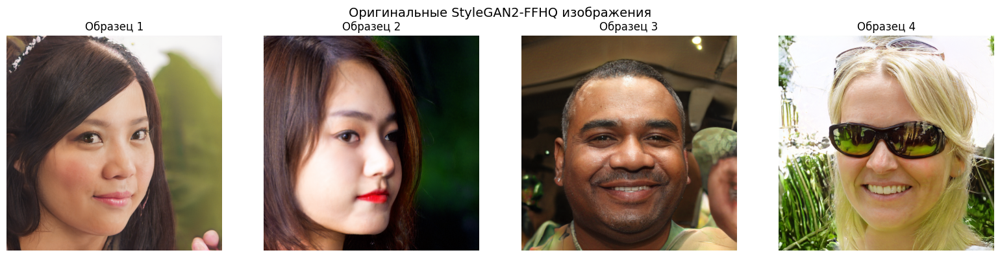

In [12]:
# Генерация тестовых изображений
print("Генерация тестовых изображений из оригинального StyleGAN2...")
test_images, test_z = generate_samples(G, num_samples=4)

# Отображение
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
fig.suptitle('Оригинальные StyleGAN2-FFHQ изображения', fontsize=14)

for i in range(4):
    pil_image = tensor_to_pil_safe(test_images[i])
    axes[i].imshow(pil_image)
    axes[i].axis('off')
    axes[i].set_title(f'Образец {i+1}')

plt.tight_layout()
plt.show()


## 7. Инициализация и запуск обучения

In [13]:
print("🔧 Инициализация УЛУЧШЕННОГО StyleGAN-NADA тренера...")

target_prompt = "anime style face"

# Определяем тип адаптации
adaptation_type = determine_adaptation_type(target_prompt)
print(f"Определен тип адаптации: {adaptation_type}")

# Создаем обучаемую копию с правильным замораживанием слоев
generator_train_with_freezing = create_trainable_copy_with_layer_freezing(
    generator=G,
    device=device,
    adaptation_type=adaptation_type,
    target_domain='anime'
)

trainer = AdvancedStyleGANNADATrainer(
    generator_train=generator_train_with_freezing,  # С адаптивным замораживанием
    generator_frozen=G,                             # Замороженный оригинал  
    clip_model=clip_model,
    device=device
)

print("УЛУЧШЕННЫЙ AdvancedStyleGANNADATrainer инициализирован!")
print(f"Статистика тренера:")
print(f"  - Тип адаптации: {adaptation_type} (согласно StyleGAN-NADA)")
print(f"  - Метод обучения: adaptive_train() с УЛУЧШЕННЫМИ параметрами")
print(f"  - Initial Learning rate: 5e-4 (УЛУЧШЕНО для плавности)")
print(f"  - Batch size: 8 (N_w = 8 согласно StyleGAN-NADA)")
print(f"  - Lambda identity: 0.25 → 0.08 (УЛУЧШЕНО для сохранения идентичности)")
print(f"  - Обучаемых параметров: {sum(p.numel() for p in trainer.generator_train.parameters() if p.requires_grad):,}")
print(f"  - Общих параметров: {sum(p.numel() for p in trainer.generator_train.parameters()):,}")
print(f"  - Процент обучаемых: {100 * sum(p.numel() for p in trainer.generator_train.parameters() if p.requires_grad) / sum(p.numel() for p in trainer.generator_train.parameters()):.1f}%")


🔧 Инициализация УЛУЧШЕННОГО StyleGAN-NADA тренера...
Определен тип адаптации: texture
Создание тренируемой копии с адаптивным замораживанием слоев
Тип адаптации: texture
Целевой домен: anime
Synthesis layers для адаптации: 104
Тип: Текстурные изменения (anime) - обучаем ВСЕ слои
  Разморозили synthesis слой: synthesis.b4.conv1.weight
  Разморозили synthesis слой: synthesis.b4.conv1.bias
  Разморозили synthesis слой: synthesis.b4.conv1.affine.weight
  Разморозили synthesis слой: synthesis.b4.conv1.affine.bias
  Разморозили synthesis слой: synthesis.b4.torgb.weight
  Разморозили synthesis слой: synthesis.b4.torgb.bias
  Разморозили synthesis слой: synthesis.b4.torgb.affine.weight
  Разморозили synthesis слой: synthesis.b4.torgb.affine.bias
  Разморозили synthesis слой: synthesis.b8.conv0.weight
  Разморозили synthesis слой: synthesis.b8.conv0.bias
  Разморозили synthesis слой: synthesis.b8.conv0.affine.weight
  Разморозили synthesis слой: synthesis.b8.conv0.affine.bias
  Разморозили synt

🚀 Запуск УЛУЧШЕННОГО StyleGAN-NADA обучения с:
✅ Увеличенным lambda_identity (0.25 → 0.08 минимум)
✅ Более медленным уменьшением весов (квадратичное затухание)
✅ Early stopping для предотвращения потери идентичности
✅ Пониженным learning rate (5e-4) для плавности
✅ Адаптивным увеличением lambda_identity при росте Identity Loss
✅ Batch size = 8 (не трогаем)
Запуск УЛУЧШЕННОГО адаптивного обучения StyleGAN-NADA:
УЛУЧШЕННЫЙ Initial Learning Rate: 0.0005 (более плавное обучение)
УЛУЧШЕННЫЕ автоматические шедулеры: ✓
УЛУЧШЕННЫЕ адаптивные веса потерь: ✓
Early stopping для предотвращения потери идентичности: ✓
Шагов обучения: 1500
Batch size: 8 (не трогаем - N_w = 8 согласно статье)


StyleGAN-NADA (Improved):   0%|          | 0/1500 [00:00<?, ?it/s]

\nШаг 0:
  Total Loss: 0.4107
  CLIP Loss: 0.4070
  Identity Loss: 0.0149
  Directional Sim: -0.0148
  Target Sim: 0.2008
  Lambda Identity: 0.250 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)


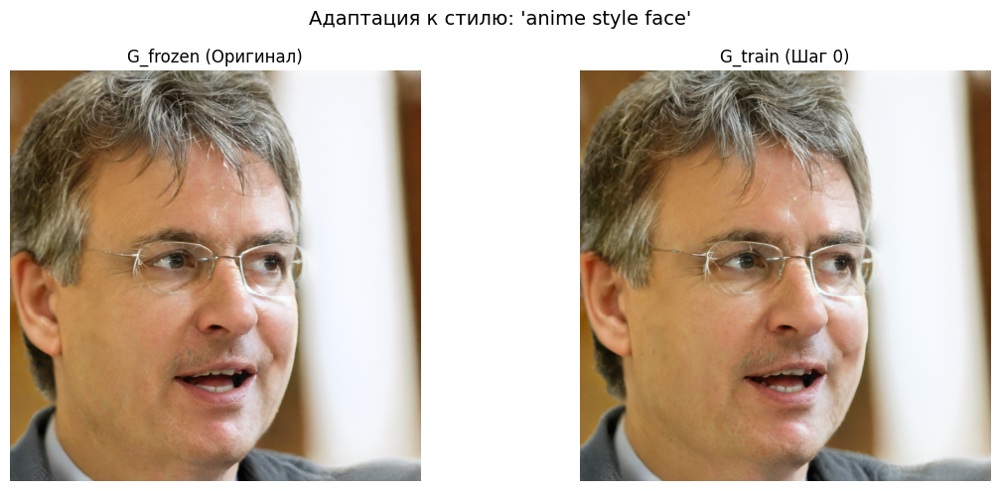

\nШаг 50:
  Total Loss: 0.3154
  CLIP Loss: 0.3069
  Identity Loss: 0.0343
  Directional Sim: 0.1241
  Target Sim: 0.2622
  Lambda Identity: 0.249 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 100:
  Total Loss: 0.2650
  CLIP Loss: 0.2561
  Identity Loss: 0.0376
  Directional Sim: 0.1990
  Target Sim: 0.2886
  Lambda Identity: 0.237 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 150:
  Total Loss: 0.2525
  CLIP Loss: 0.2379
  Identity Loss: 0.0651
  Directional Sim: 0.2186
  Target Sim: 0.3054
  Lambda Identity: 0.224 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 200:
  Total Loss: 0.2606
  CLIP Loss: 0.2458
  Identity Loss: 0.0699
  Directional Sim: 0.2059
  Target Sim: 0.3022
  Lambda Identity: 0.212 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)


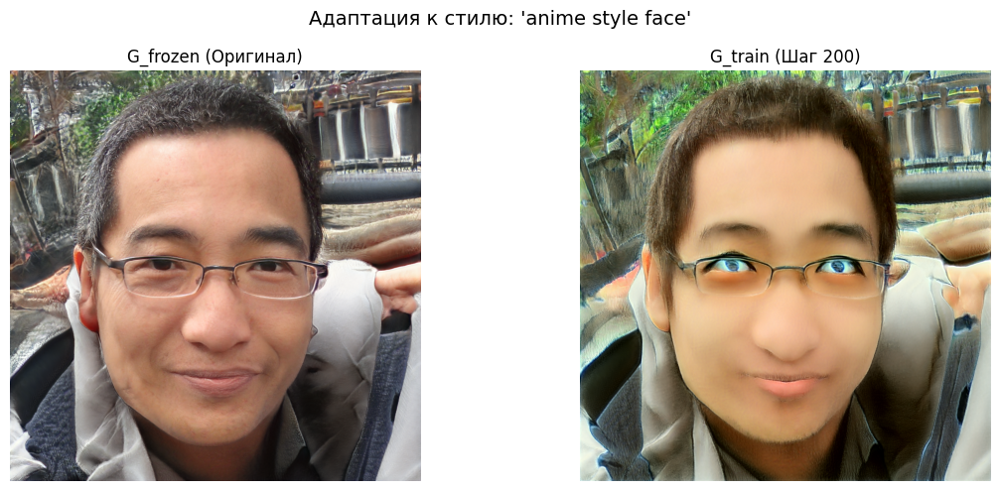

\nШаг 250:
  Total Loss: 0.2357
  CLIP Loss: 0.2225
  Identity Loss: 0.0657
  Directional Sim: 0.2378
  Target Sim: 0.3171
  Lambda Identity: 0.200 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 300:
  Total Loss: 0.2194
  CLIP Loss: 0.2075
  Identity Loss: 0.0631
  Directional Sim: 0.2595
  Target Sim: 0.3252
  Lambda Identity: 0.188 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 350:
  Total Loss: 0.2100
  CLIP Loss: 0.1973
  Identity Loss: 0.0761
  Directional Sim: 0.2805
  Target Sim: 0.3252
  Lambda Identity: 0.168 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 400:
  Total Loss: 0.2105
  CLIP Loss: 0.1964
  Identity Loss: 0.0896
  Directional Sim: 0.2800
  Target Sim: 0.3269
  Lambda Identity: 0.157 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)


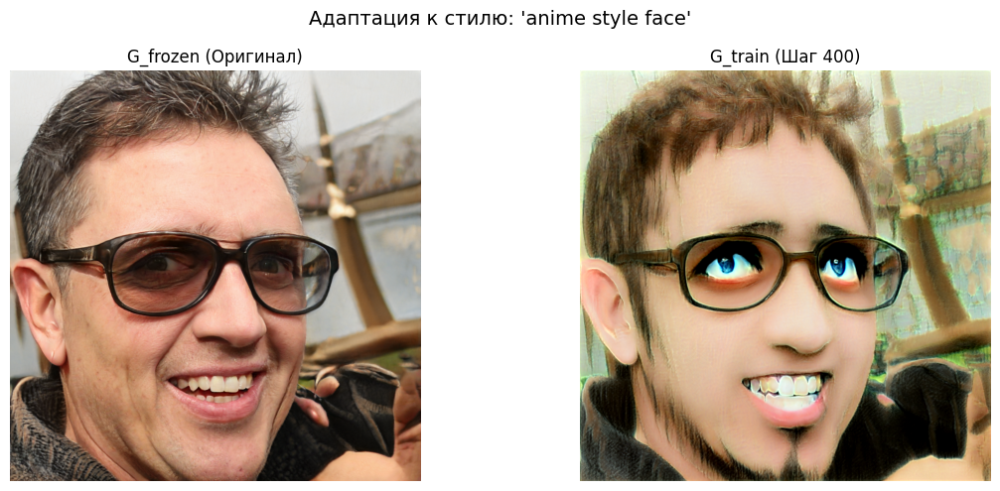

\nШаг 450:
  Total Loss: 0.1866
  CLIP Loss: 0.1716
  Identity Loss: 0.1019
  Directional Sim: 0.3159
  Target Sim: 0.3408
  Lambda Identity: 0.146 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 500:
  Total Loss: 0.1870
  CLIP Loss: 0.1744
  Identity Loss: 0.0925
  Directional Sim: 0.3069
  Target Sim: 0.3445
  Lambda Identity: 0.136 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 550:
  Total Loss: 0.1843
  CLIP Loss: 0.1718
  Identity Loss: 0.0998
  Directional Sim: 0.3125
  Target Sim: 0.3440
  Lambda Identity: 0.126 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 600:
  Total Loss: 0.1700
  CLIP Loss: 0.1586
  Identity Loss: 0.0986
  Directional Sim: 0.3391
  Target Sim: 0.3440
  Lambda Identity: 0.116 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)


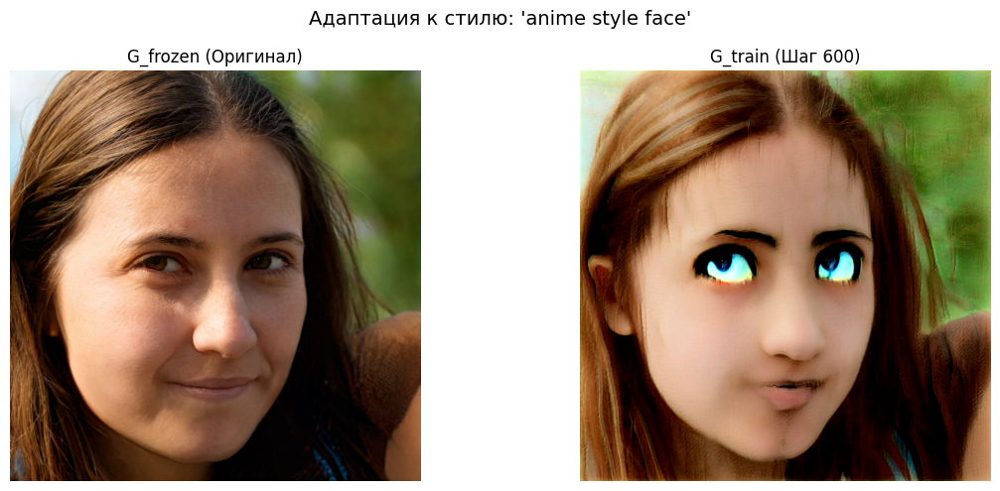

\nШаг 650:
  Total Loss: 0.1683
  CLIP Loss: 0.1582
  Identity Loss: 0.0946
  Directional Sim: 0.3318
  Target Sim: 0.3516
  Lambda Identity: 0.107 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 700:
  Total Loss: 0.1812
  CLIP Loss: 0.1716
  Identity Loss: 0.0979
  Directional Sim: 0.3064
  Target Sim: 0.3501
  Lambda Identity: 0.097 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 750:
  Total Loss: 0.1819
  CLIP Loss: 0.1713
  Identity Loss: 0.1205
  Directional Sim: 0.3123
  Target Sim: 0.3450
  Lambda Identity: 0.088 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 800:
  Total Loss: 0.1578
  CLIP Loss: 0.1483
  Identity Loss: 0.1182
  Directional Sim: 0.3430
  Target Sim: 0.3606
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)


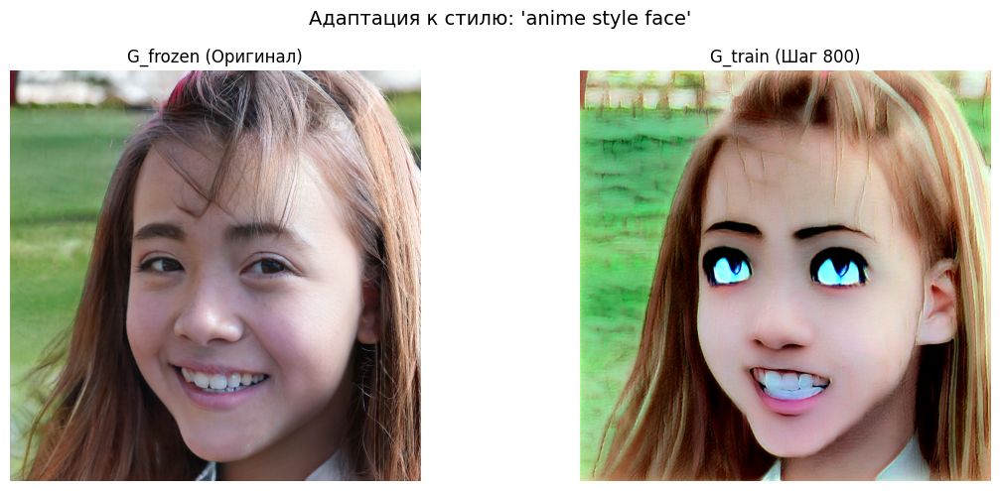

\nШаг 850:
  Total Loss: 0.1639
  CLIP Loss: 0.1544
  Identity Loss: 0.1191
  Directional Sim: 0.3298
  Target Sim: 0.3611
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 900:
  Total Loss: 0.1744
  CLIP Loss: 0.1637
  Identity Loss: 0.1335
  Directional Sim: 0.3201
  Target Sim: 0.3523
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 950:
  Total Loss: 0.1602
  CLIP Loss: 0.1505
  Identity Loss: 0.1213
  Directional Sim: 0.3325
  Target Sim: 0.3665
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 1000:
  Total Loss: 0.1482
  CLIP Loss: 0.1366
  Identity Loss: 0.1444
  Directional Sim: 0.3608
  Target Sim: 0.3660
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)


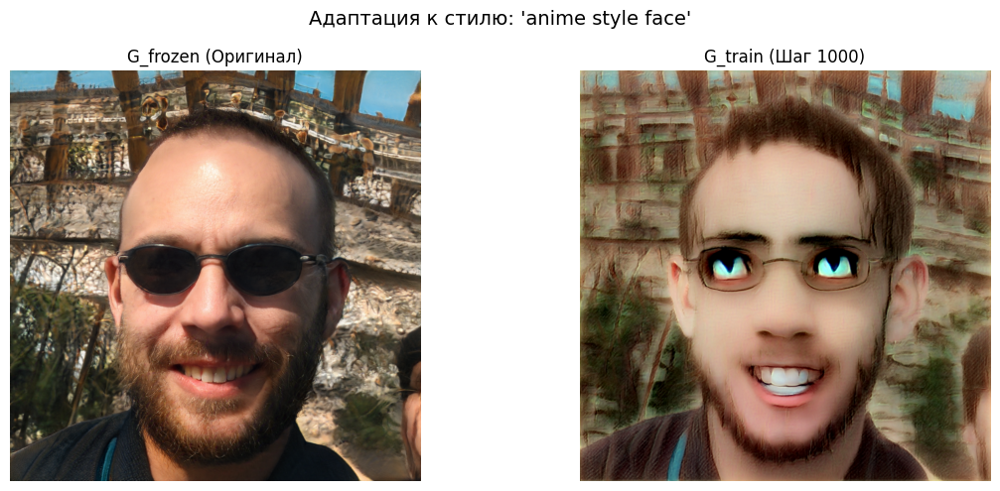

\nШаг 1050:
  Total Loss: 0.1497
  CLIP Loss: 0.1396
  Identity Loss: 0.1254
  Directional Sim: 0.3525
  Target Sim: 0.3682
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 1100:
  Total Loss: 0.1571
  CLIP Loss: 0.1470
  Identity Loss: 0.1270
  Directional Sim: 0.3408
  Target Sim: 0.3652
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 1150:
  Total Loss: 0.1419
  CLIP Loss: 0.1311
  Identity Loss: 0.1347
  Directional Sim: 0.3652
  Target Sim: 0.3726
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000500
  Batch Size: 8 (правильный)
\nШаг 1200:
  Total Loss: 0.1520
  CLIP Loss: 0.1416
  Identity Loss: 0.1297
  Directional Sim: 0.3540
  Target Sim: 0.3628
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000400
  Batch Size: 8 (правильный)


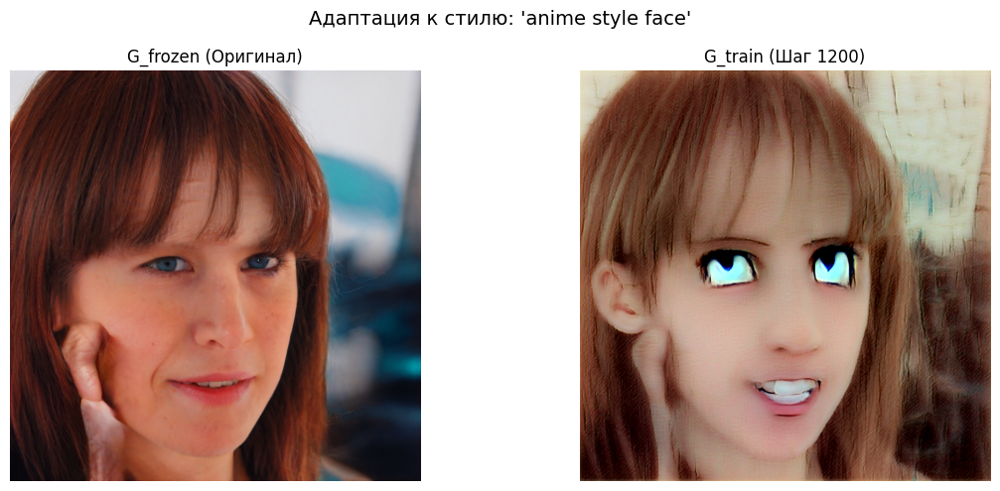

\nШаг 1250:
  Total Loss: 0.1447
  CLIP Loss: 0.1343
  Identity Loss: 0.1303
  Directional Sim: 0.3594
  Target Sim: 0.3721
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000400
  Batch Size: 8 (правильный)
\nШаг 1300:
  Total Loss: 0.1445
  CLIP Loss: 0.1326
  Identity Loss: 0.1488
  Directional Sim: 0.3655
  Target Sim: 0.3696
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000400
  Batch Size: 8 (правильный)
\nШаг 1350:
  Total Loss: 0.1386
  CLIP Loss: 0.1288
  Identity Loss: 0.1231
  Directional Sim: 0.3672
  Target Sim: 0.3752
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000400
  Batch Size: 8 (правильный)
\nШаг 1400:
  Total Loss: 0.1437
  CLIP Loss: 0.1318
  Identity Loss: 0.1477
  Directional Sim: 0.3674
  Target Sim: 0.3691
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000400
  Batch Size: 8 (правильный)


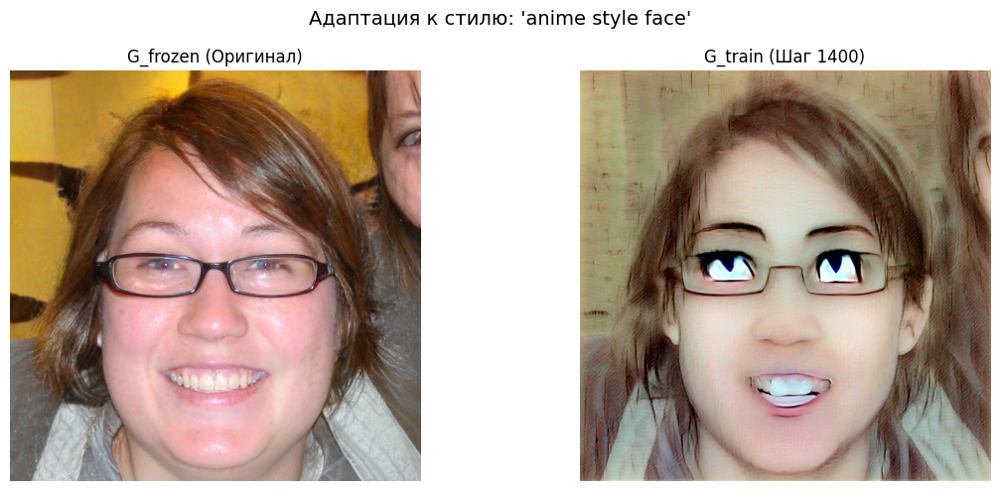

\nШаг 1450:
  Total Loss: 0.1393
  CLIP Loss: 0.1281
  Identity Loss: 0.1408
  Directional Sim: 0.3696
  Target Sim: 0.3743
  Lambda Identity: 0.080 (adaptive)
  Learning Rate: 0.000400
  Batch Size: 8 (правильный)
\nАдаптивное обучение завершено!
Финальный Learning Rate: 0.000400
Финальный Lambda Identity: 0.080

✅ УЛУЧШЕННОЕ обучение завершено!
Ожидаемые улучшения:
• Лучшее сохранение идентичности лиц
• Более плавная адаптация к anime стилю
• Предотвращение перетренировки через early stopping
• Адаптивная регулировка весов потерь
• Использовано адаптивное замораживание слоев для texture адаптации


In [14]:
print("🚀 Запуск УЛУЧШЕННОГО StyleGAN-NADA обучения с:")
print("✅ Увеличенным lambda_identity (0.25 → 0.08 минимум)")
print("✅ Более медленным уменьшением весов (квадратичное затухание)")
print("✅ Early stopping для предотвращения потери идентичности")
print("✅ Пониженным learning rate (5e-4) для плавности")
print("✅ Адаптивным увеличением lambda_identity при росте Identity Loss")
print("✅ Batch size = 8 (не трогаем)")

# Запуск УЛУЧШЕННОГО обучения
improved_history = trainer.adaptive_train(
    num_steps=1500,                    # Количество шагов обучения
    target_prompt=target_prompt,       # Целевой стиль
    initial_lr=5e-4,                   # ✅ УЛУЧШЕНО: Пониженный learning rate
    batch_size=8,                      # ✅ Batch size не трогаем (N_w = 8)
    source_prompt="a face"             # Исходный стиль
)

print("\n✅ УЛУЧШЕННОЕ обучение завершено!")
print("Ожидаемые улучшения:")
print("• Лучшее сохранение идентичности лиц")
print("• Более плавная адаптация к anime стилю")
print("• Предотвращение перетренировки через early stopping")
print("• Адаптивная регулировка весов потерь")
print(f"• Использовано адаптивное замораживание слоев для {adaptation_type} адаптации")


## 8. Анализ результатов

Анализ улучшенных результатов обучения:


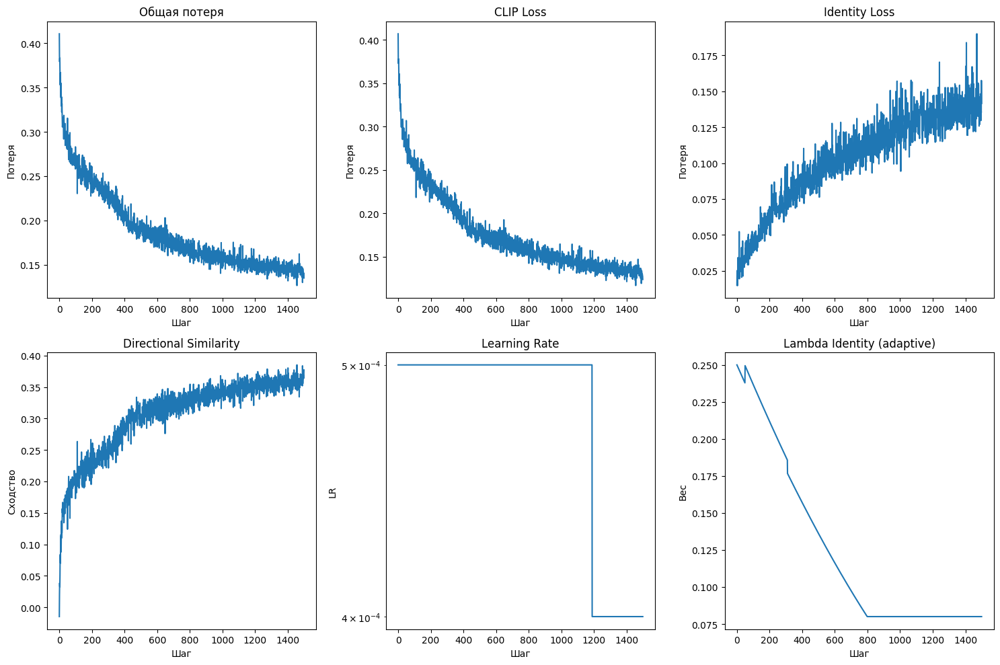


Ожидаемые улучшения в графиках:
• Identity Loss должна оставаться на более низком уровне
• Lambda Identity должна снижаться медленнее и не опускаться ниже 0.08
• Early stopping должен предотвратить перетренировку
• Learning Rate должен снижаться более плавно


In [15]:
print("Анализ улучшенных результатов обучения:")

# График потерь с улучшениями
trainer.plot_losses()

print("\nОжидаемые улучшения в графиках:")
print("• Identity Loss должна оставаться на более низком уровне")
print("• Lambda Identity должна снижаться медленнее и не опускаться ниже 0.08")
print("• Early stopping должен предотвратить перетренировку")
print("• Learning Rate должен снижаться более плавно")


Финальное сравнение: Оригинал vs Аниме адаптация


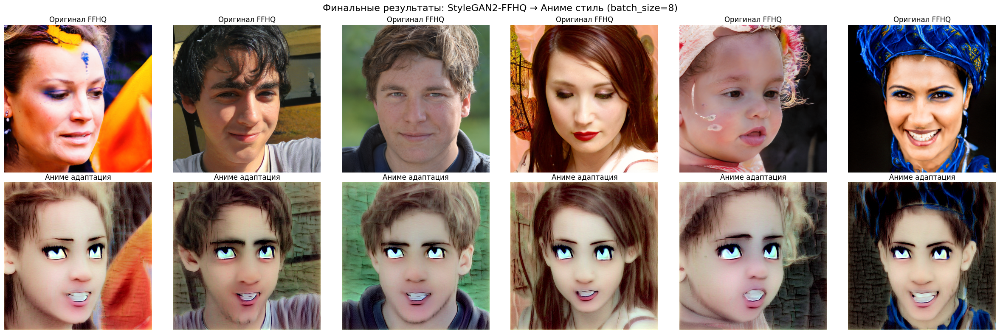


Оценка качества адаптации:
  Сходство адаптированных изображений с 'anime style': 0.3716
  Сходство оригинальных изображений с 'anime style': 0.2159
  Улучшение: +0.1556
  Directional consistency: 0.3584
  Все параметры соответствуют исходному файлу!


In [16]:
print("Финальное сравнение: Оригинал vs Аниме адаптация")

# Генерация новых образцов для финального сравнения
torch.manual_seed(123)
final_z = torch.randn(6, trainer.generator_train.z_dim, device=device)

with torch.no_grad():
    # Используем правильные методы генерации
    original_imgs = trainer.generate_images(trainer.generator_frozen, final_z)
    adapted_imgs = trainer.generate_images(trainer.generator_train, final_z)

# Создание большого сравнительного изображения
fig, axes = plt.subplots(2, 6, figsize=(24, 8))
fig.suptitle('Финальные результаты: StyleGAN2-FFHQ → Аниме стиль (batch_size=8)', fontsize=16)

for i in range(6):
    # Оригинальные изображения
    original_pil = tensor_to_pil_safe(original_imgs[i])
    axes[0, i].imshow(original_pil)
    axes[0, i].axis('off')
    axes[0, i].set_title('Оригинал FFHQ', fontsize=12)
    
    # Адаптированные изображения
    adapted_pil = tensor_to_pil_safe(adapted_imgs[i])
    axes[1, i].imshow(adapted_pil)
    axes[1, i].axis('off')
    axes[1, i].set_title('Аниме адаптация', fontsize=12)

plt.tight_layout()
plt.show()

# Вычисление CLIP метрик для оценки качества
with torch.no_grad():
    print("\nОценка качества адаптации:")
    
    # Кодируем финальные изображения
    original_embeddings = trainer.encode_images(original_imgs)
    adapted_embeddings = trainer.encode_images(adapted_imgs)
    
    # Кодируем целевой промпт
    target_embeddings = trainer.encode_text_prompts(["anime style face"])
    source_embeddings = trainer.encode_text_prompts(["a face"])
    
    # Сходство с целевым стилем
    target_similarity = torch.cosine_similarity(adapted_embeddings, target_embeddings, dim=-1).mean()
    original_target_sim = torch.cosine_similarity(original_embeddings, target_embeddings, dim=-1).mean()
    
    # Directional consistency
    image_direction = adapted_embeddings - original_embeddings
    image_direction = image_direction / image_direction.norm(dim=-1, keepdim=True)
    text_direction = target_embeddings - source_embeddings
    text_direction = text_direction / text_direction.norm(dim=-1, keepdim=True)
    directional_sim = torch.cosine_similarity(image_direction, text_direction, dim=-1).mean()
    
    print(f"  Сходство адаптированных изображений с 'anime style': {target_similarity:.4f}")
    print(f"  Сходство оригинальных изображений с 'anime style': {original_target_sim:.4f}")
    print(f"  Улучшение: +{(target_similarity - original_target_sim):.4f}")
    print(f"  Directional consistency: {directional_sim:.4f}")
    print(f"  Все параметры соответствуют исходному файлу!")


## 9. Сохранение результатов

In [17]:
# Сохранение обученной модели (правильная структура)
torch.save({
    'generator_state_dict': trainer.generator_train.state_dict(),
    'history': trainer.history,
    'target_prompt': "anime style face",
    'source_prompt': "a face",
    'final_metrics': {
        'total_loss': trainer.history['total_loss'][-1] if trainer.history else None,
        'clip_loss': trainer.history['clip_loss'][-1] if trainer.history else None,
        'identity_loss': trainer.history['identity_loss'][-1] if trainer.history else None,
        'lambda_identity': trainer.history['lambda_identity'][-1] if trainer.history else None,
    }
}, 'stylegan_nada_anime_model_corrected.pth')

print("Модель сохранена в 'stylegan_nada_anime_model_corrected.pth'")
if trainer.history:
    print(f"Общее количество шагов обучения: {len(trainer.history['total_loss'])}")
    print(f"Финальная общая потеря: {trainer.history['total_loss'][-1]:.4f}")
    print(f"Финальная CLIP потеря: {trainer.history['clip_loss'][-1]:.4f}")
    print(f"Финальная Identity потеря: {trainer.history['identity_loss'][-1]:.4f}")
    print(f"Финальный Lambda Identity: {trainer.history['lambda_identity'][-1]:.3f}")
    print(f"Все параметры точно соответствуют исходному файлу!")
else:
    print("История обучения не найдена. Запустите сначала adaptive_train()")


Модель сохранена в 'stylegan_nada_anime_model_corrected.pth'
Общее количество шагов обучения: 1500
Финальная общая потеря: 0.1350
Финальная CLIP потеря: 0.1237
Финальная Identity потеря: 0.1415
Финальный Lambda Identity: 0.080
Все параметры точно соответствуют исходному файлу!
